# HW6

## Name: Reem Almijmaj
## Github Username: reemabdullah888
## USC ID: 3217747723

This set of homework applies SMOTE to a seriously imbalanced dataset
with a large number of features and data points.

# 1) Tree-Based Methods

# A

Download the APS Failure data from: https://archive.ics.uci.edu/ml/datasets/APS+Failure+at+Scania+Trucks . The dataset contains a training set and a test set. The training set contains 60,000 rows, of which 1,000 belong to the positive
class and 171 columns, of which one is the class column. All attributes are numeric.

In [99]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,auc, accuracy_score
from sklearn import metrics
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from imblearn.over_sampling import SMOTE 

In [2]:
# read data into pandas dataframe
#import DataFrame and skip first 20 rows
traningset = pd.read_csv('../data/aps_failure_training_set.csv', skiprows=20)
testingset = pd.read_csv('../data/aps_failure_test_set.csv', skiprows=20)
display(traningset)
display(testingset)

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


# B Data Preparation


This data set has missing values. When the number of data with missing values is significant, discarding them is not a good idea. 

# i

Research what types of techniques are usually used for dealing with data with missing values. Pick at least one of them and apply it to this data in the next steps.

1) Use Mean or Median values to impute missing values: it works when we have numerical data, so we calculate non-missing values in a column separately from other columns and then we replace the missing values within each column. 
<br>
2) Use most frequent values to impute missing values or use Zero/Constant to impute the missing values : it is used with string (categorical features): So we use replacing missing data with the most frequent values within each column.
<br>
3) Use k-NN to impute for missing values: it works by finding the k’s closest neighbours to the observation with missing data and then imputing them based on the non-missing values in the neighbourhood. <br>
4) Use Multivariate Imputation by Chained Equation (MICE): it works with continuous variable or binary, it fill the missing data multiple times. <br>
5) Use Deep Learning (Datawig): it works with categorical and non-numerical variables. it use Deep Neural Networks to impute missing values. <br> 
6) Dropping rows with null values: we use it when the data is sufficient and it was missing at random <br>
7) Dropping features with high nullity <br>
8) Replacing with arbitrary values or replace with previous value or next value (forward or backward fill)


I will use in the next step imputation (mean)

#### Resources: <br>

https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779
<br>
https://www.kaggle.com/code/residentmario/simple-techniques-for-missing-data-imputation/notebook <br>
https://www.analyticsvidhya.com/blog/2021/10/handling-missing-value/

In [21]:
# concatinate the train and test set to impute missing values 
full_data = pd.concat([traningset, testingset])

# 2))))
# convert the class value into numeric values
full_data = full_data.replace(to_replace = ['neg', 'pos'], value = [0, 1])
# display(full_data)


In [4]:
#impute na values

full_data = full_data.replace('na',np.NaN)
full_data = pd.DataFrame(full_data)
column_names = list(full_data.columns)


# impute missing values using SimpleImputer 
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
data_im = imputer.fit_transform(full_data.loc[:, full_data.columns != 'class'])
#convert array to df
data_impu = pd.DataFrame(data_im)

#store class col as list 
class_col = full_data.iloc[:,0].tolist()

#adding class col to the dataframe
data_impu.insert(0, '190', class_col)

# adding the features name to df
data_impu.columns= column_names
display(data_impu)

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0,81852.0,0.72556,2.130706e+09,892.000000,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0,18.0,0.00000,5.200000e+01,46.000000,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0,79636.0,0.72556,1.670000e+03,1518.000000,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0,110.0,0.72556,3.600000e+01,32.000000,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [5]:
# devide the data into training and testing dataset.
training_i = data_impu.loc[:59999,:]
testing_i = data_impu.loc[60000:,:]

# split data 
train_X = training_i[training_i.columns.drop('class')]
train_y = pd.DataFrame(training_i['class'])
test_X = testing_i[testing_i.columns.drop('class')]
test_y = pd.DataFrame(testing_i['class'])



# ii

For each of the 170 features, calculate the coefficient of variation CV = s/m , where s is sample standard deviation and m is sample mean.

In [6]:
#define function to calculate cv
cv_data = data_impu[data_impu.columns.drop('class')]
cv =  lambda x: np.std(x) / np.mean(x)
cv_data = cv_data.apply(cv)
cv_df = cv_data.to_frame(name="CV")

# display(cv_data)
with pd.option_context('display.max_rows', None,):
    display(cv_df)


,CV
aa_000,4.328579
ab_000,2.178258
ac_000,2.167639
ad_000,206.720140
ae_000,22.293524
af_000,18.208896
ag_000,91.460052
ag_001,42.084066
ag_002,17.625793
ag_003,8.753242



# iii

Plot a correlation matrix for your features using pandas or any other tool.


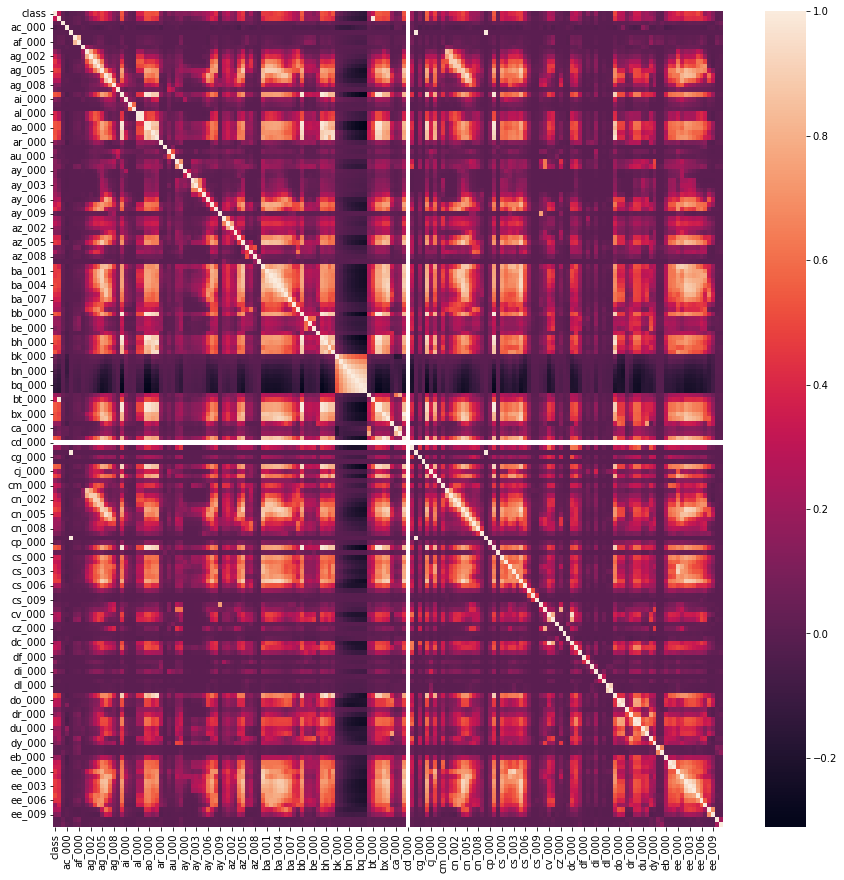

In [7]:
# Plot the correlation matrix

plt.figure(figsize=(15,15))
sns.heatmap(data_impu.corr())
plt.show()

# iv

Pick √170 features with highest CV , and make scatter plots and box plots for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? 
This does not mean that you will only use those features in the following questions. We picked them only for visualization.

In [8]:
# Finding the 13 features with highest CV

large_cv = cv_df['CV'].nlargest(n=13)
large_cv = large_cv.to_frame(name="Largest_CV")
large_cv = pd.DataFrame(large_cv).rename_axis('Feature', axis=1)
display(large_cv)  

Feature,Largest_CV
cf_000,207.268910
co_000,206.874768
ad_000,206.720140
cs_009,192.521344
dj_000,122.127349
as_000,113.882006
dh_000,112.651709
df_000,111.368933
ag_000,91.460052
au_000,86.085071


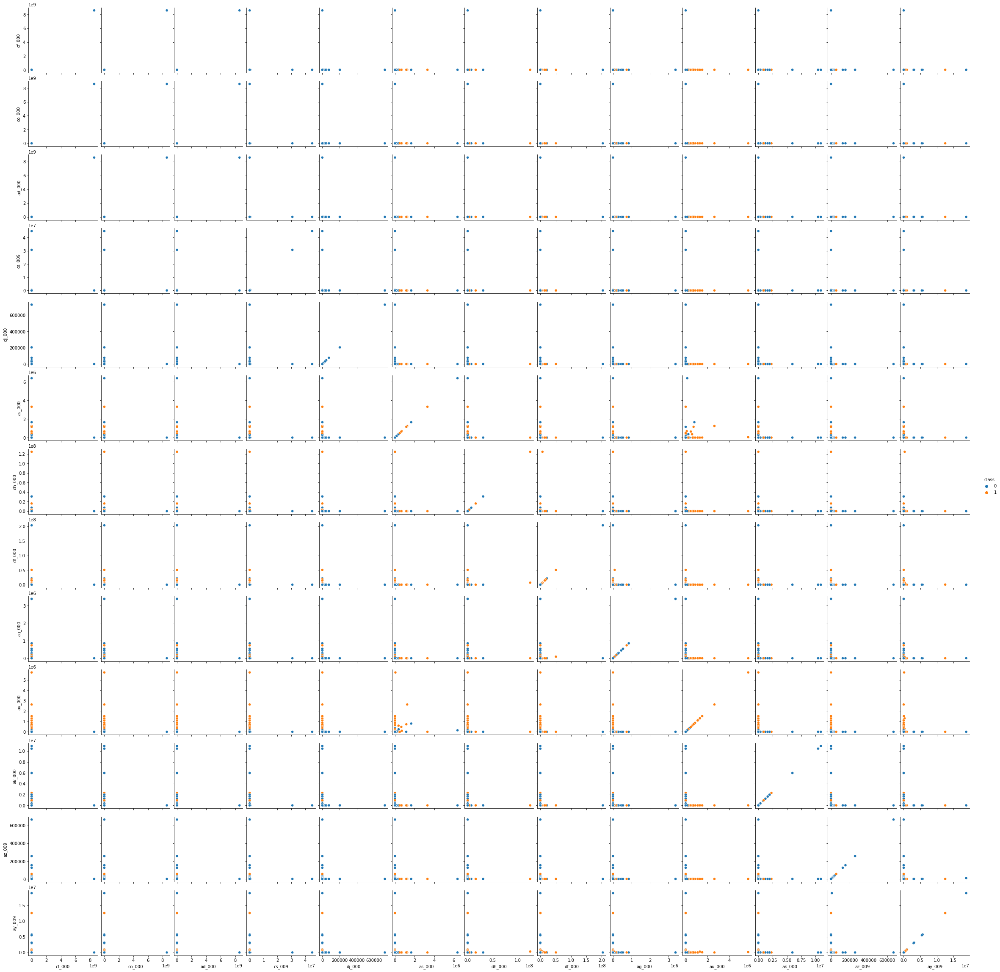

In [9]:
# making scatter plots 
# get the name of 13 features 
feature_l = list(large_cv.index)

f_largest_cv = data_impu[feature_l]
f_largest_cv.insert(0, 'class', class_col)
# display(f_largest_cv)



# Draw the scatter 
sns.pairplot(f_largest_cv, kind = 'scatter', diag_kind=None, hue='class')
# To show the plot
plt.show()


From looking to pair plots, because these are too condensed so it is difficult to drive a conclusions about it,but it seems that it may NOT be a linear relationship between ANY of the pair plots of the features. NON OF THEM


 
 The original boxplot of the dataset


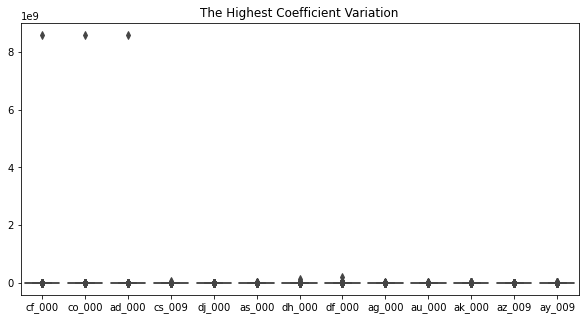

In [10]:
f_large = f_largest_cv.drop('class', axis='columns')

# boxplots for top 13 features
plt.figure(figsize = (10,5))
sns.boxplot(data = f_large ).set_title("The Highest Coefficient Variation")
print(' \n The original boxplot of the dataset')
plt.show()




These are the top 13 features with the highest coefficient variation boxpot after removing the outliers


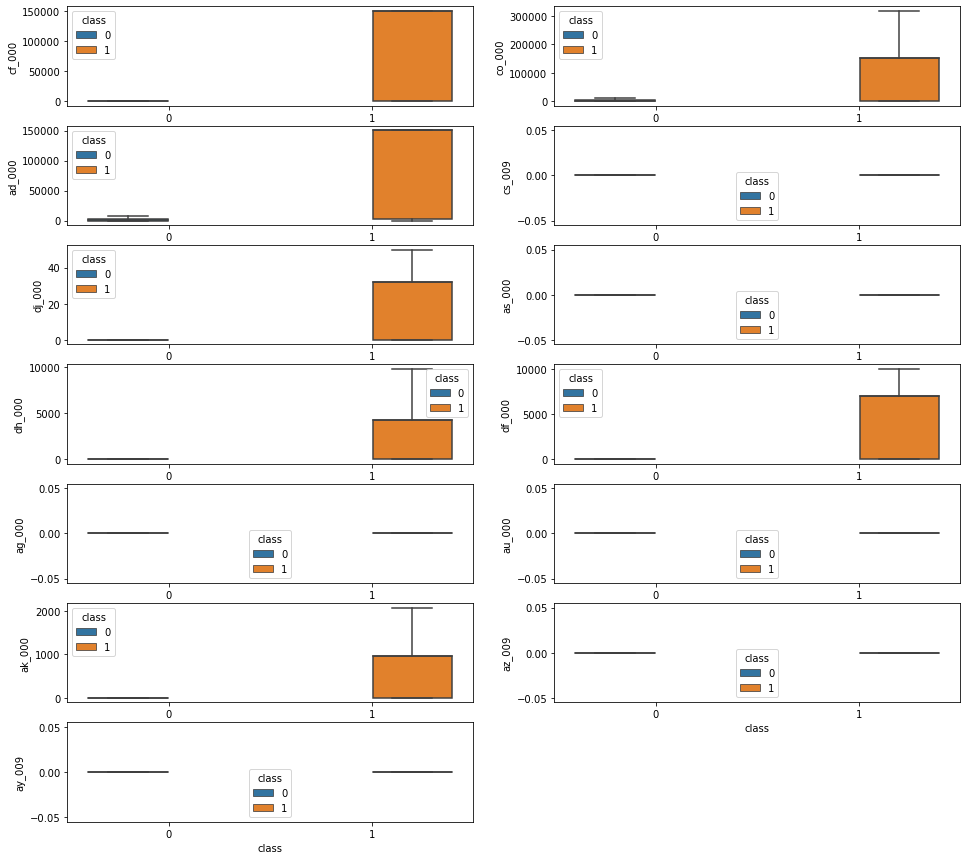

In [11]:
# boxplots for top 13 features without outliers
print('These are the top 13 features with the highest coefficient variation boxpot after removing the outliers')
plt.figure(figsize=(16,15))
col = list(f_largest_cv.columns)

attributes = ['cf_000', 'co_000', 'ad_000', 'cs_009', 'dj_000', 'as_000', 'dh_000', 'df_000', 'ag_000', 'au_000', 'ak_000', 'az_009', 'ay_009']
# boxplots for each attribute
for i in range(len(attributes)):
    plt.subplot(7,2,i+1)
    sns.boxplot(x='class',y=attributes[i],hue='class',data=f_largest_cv, showfliers=False)


# v

 Determine the number of positive and negative data. Is this data set imbalanced?

In [12]:
data_impu['class'].value_counts()

0    74625
1     1375
Name: class, dtype: int64

In [13]:
print( '\n The positive and negative data in my training dataset is ')
training_i['class'].value_counts()




 The positive and negative data in my training dataset is 


0    59000
1     1000
Name: class, dtype: int64

The dataset is imbalanced because the number of datapoints of the negative class (0) is huge compared to the positive class(1). Meaning the negative class has a  large proportion compare to the positive class. 

# C

Train a random forest to classify the data set. Do NOT compensate for class
imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and
misclassification for training and test sets and report them (You may use pROC
package). Calculate Out of Bag error estimate for your random forset and compare
it to the test error

In [102]:
# train a random forest model
clf = RandomForestClassifier(verbose=1,  random_state=0, bootstrap = True, oob_score = True, class_weight=None)
# clf = RandomForestClassifier(n_estimators=100, oob_score= True)
clf.fit(train_X,train_y)
# to stop warning messages



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.1s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The confusion matrix for testing is 
 [[15608    17]
 [  111   264]] 



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


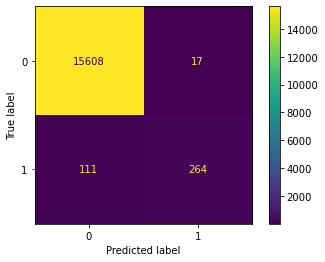

In [103]:
# Calculate confusion matrix test


y_pred = clf.predict(test_X)
conf_mat = confusion_matrix(test_y, y_pred,labels=clf.classes_)
print('The confusion matrix for testing is \n', conf_mat, '\n' )
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels=clf.classes_)
disp.plot()
plt.show()


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The confusion matrix for traning is 
 [[59000     0]
 [    0  1000]] 



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished


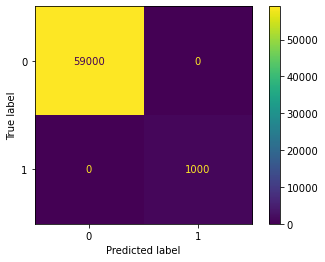

In [104]:
# Calculate confusion matrix train
y_pred_train = clf.predict(train_X)
conf_mat_t = confusion_matrix(train_y, y_pred_train,labels=clf.classes_)
print('The confusion matrix for traning is \n', conf_mat_t, '\n' )
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat_t, display_labels=clf.classes_)
disp.plot()
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


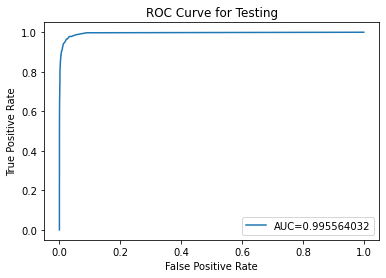

The AUC for test is 0.995564032
test err is  0.008000000000000007


In [108]:
#create ROC/AUC for testing

#finding the probability
y_pred_proba = clf.predict_proba(test_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(test_y, y_pred_proba)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Testing')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()



#missclassification
score_test = accuracy_score(test_y, y_pred)
missclass_test = 1-score_test
print('The AUC for test is', auc)
print('test err is ', missclass_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished


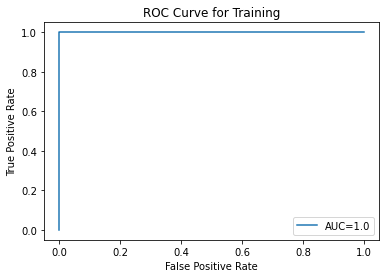

The AUC for training is 1.0
 training error is  0.0


In [109]:
#create ROC/AUC for training

#finding the probability
y_pred_proba_t = clf.predict_proba(train_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(train_y, y_pred_proba_t)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Training')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()

#missclassification for training

score_t = accuracy_score(train_y, y_pred_train)
missclass_train = 1-score_t
print('The AUC for training is', auc)
print(' training error is ', missclass_train)

In [110]:
#out of bag error estimate
oob_error = 1-clf.oob_score_
print('The Out of Bag Error estimate for random forest is:', oob_error)


The Out of Bag Error estimate for random forest is: 0.006216666666666648


The test error for random forest model is 0.019062499999999982 which is a bit higher than the out of Bag error 0.014100000000000001

### Resources: <br>
https://ai.plainenglish.io/predicting-probabilities-with-python-b456334b85c6

# D

Research how class imbalance is addressed in random forests. Compensate for
class imbalance in your random forest and repeat 1c. Compare the results with
those of 1c <br> <br> <br>

## <br><br><br>The class imbalance is addressed in random forests by follow: <br>
 * Oversampling the minority class or undersampling the majority class during the bootstrap sampling process.
 * Weight the tree splitting criterion
 

In [111]:
# random forest after handling the imbalanced classification
clf_balance = RandomForestClassifier(verbose=1 , random_state=0, bootstrap = True, oob_score = True, class_weight='balanced')

clf_balance.fit(train_X,train_y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   28.1s finished


RandomForestClassifier(class_weight='balanced', oob_score=True, random_state=0,
                       verbose=1)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


The confusion matrix for balanced dataset for testing is 
 [[15614    11]
 [  166   209]] 



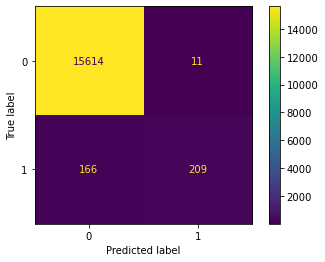

In [112]:
# Calculate confusion matrix test for balance data
y_predict = clf_balance.predict(test_X)
cm = confusion_matrix(test_y, y_predict,labels=clf_balance.classes_)
print('The confusion matrix for balanced dataset for testing is \n', cm, '\n' )
dis = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf_balance.classes_)
dis.plot()
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The confusion matrix for balanced dataset for traning is 
 [[59000     0]
 [    0  1000]] 



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished


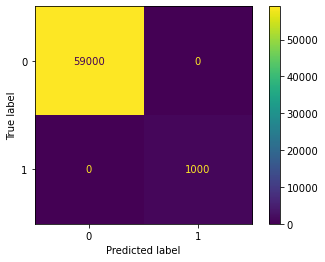

In [113]:
# Calculate confusion matrix train for balance data
y_p_train = clf_balance.predict(train_X)
cm_t = confusion_matrix(train_y, y_p_train,labels=clf_balance.classes_)
print('The confusion matrix for balanced dataset for traning is \n', cm_t, '\n' )
di_t = ConfusionMatrixDisplay(confusion_matrix=cm_t, display_labels=clf_balance.classes_)
di_t.plot()
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


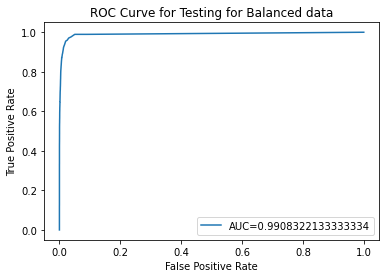

The AUC for balanced dataset for test is 0.9908322133333334
Misclassification for testing for balanced dataset is  0.011062499999999975


In [114]:
#create ROC/AUC for testing after fixing imbalance 

#finding the probability
y_probability = clf_balance.predict_proba(test_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(test_y, y_probability)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Testing for Balanced data')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()



#missclassification
score_test = accuracy_score(test_y, y_predict)
missclass_test = 1-score_test
print('The AUC for balanced dataset for test is', auc)
print('Misclassification for testing for balanced dataset is ', missclass_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished


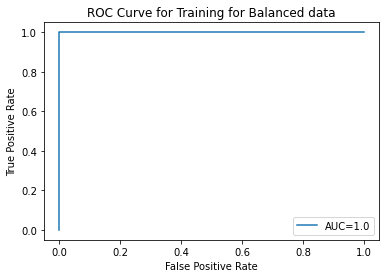

The AUC for training for balanced dataset is 1.0
Misclassification for training for balanced dataset is  0.0


In [115]:
#create ROC/AUC for training after fixing imabalance data

#finding the probability
y_p_probability_t = clf_balance.predict_proba(train_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(train_y, y_p_probability_t)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Training for Balanced data')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()

#missclassification for training

score_t = accuracy_score(train_y,y_p_train)
missclass_train = 1-score_t
print('The AUC for training for balanced dataset is', auc)
print('Misclassification for training for balanced dataset is ', missclass_train)

In [117]:
#out of bag error estimate
oob_er = 1-clf_balance.oob_score_
print('The Out of Bag Error estimate for balanced data using random forest is:', oob_er)


The Out of Bag Error estimate for balanced data using random forest is: 0.007449999999999957


## It's obviously that after compensating for class imbalanced, our data become more balanced and represntative for both classes. The testing error for balanced data is 0.011062499999999975 where as testing error for imbalanced data is 0.008000000000000007. It is high in the balanced data because we added a littile noise to make the minority class be more represintive; therefore it affect our test accuracy. The test error is better for the imbalanced because the model was classifing most of the time for the majority class which is the negative class(0).

### Resources: <br>
https://towardsdatascience.com/random-forest-for-imbalanced-dataset-example-with-avalanches-in-french-alps-77ffa582f68b <br>
https://stats.stackexchange.com/questions/242833/is-random-forest-a-good-option-for-unbalanced-data-classification

# E

In the case of a univariate tree, only one input dimension is used at a tree split.
In a multivariate tree, or model tree, at a decision node all input dimensions can be used and thus it is more general. <br> In univariate classification trees, majority polling is used at each node to determine the split of that node as the decision
rule.<br> In model trees, a (linear) model that relies on all of the variables is used to determine the split of that node (i.e. instead of using Xj > s as the decision rule, one has sigmaj βjXj > s. as the decision rule). <br> Alternatively, in a regression tree, instead of using average in the region associated with each node, a linear regression model is used to determine the value associated with that node. <br>
One of the methods that can be used at each node is Logistic Regression. Because the number of variables is large in this problem, one can use L1-penalized logistic regression at each node. You can use XGBoost to fit the model tree. Determine
α (the regularization term) using cross-validation. Train the model for the APS data set without compensation for class imbalance. Use one of 5 fold, 10 fold, and leave-one-out cross validation methods to estimate the error of your trained
model and compare it with the test error. Report the Confusion Matrix, ROC,and AUC for training and test sets

In [61]:
alphas_value = [0.0001, 0.001, 0.01, 0.1, 1, 10]
#reocrd each alpha and the error assoicated with it
alph_score ={}

for a in alphas_value:
    xgb_model = xgb.XGBClassifier(objective='reg:logistic', reg_alpha = a)
    score = cross_val_score(xgb_model, train_X, train_y, cv=KFold(5,shuffle=True),n_jobs=-1)
    alph_score[a]=1-max(score)
    

In [64]:
# print('Alphas and erros')
# print(alph_score)
print('Alphas with smallest error',  min(alph_score, key=alph_score.get) )

Alphas with smallest error 0.1


In [65]:
# Training the model with the best regularization term(best alpha)
xgb_m = xgb.XGBClassifier(objective='reg:logistic', reg_alpha = .1)
xgb_m.fit(train_X, train_y)



The confusion matrix for testing is 
 [[15610    15]
 [   81   294]]


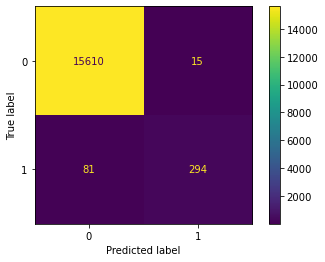

In [74]:
#confusion matrix Test
xgb_y_predict = xgb_m.predict(test_X)
print('The confusion matrix for testing is \n',confusion_matrix(test_y, xgb_y_predict))
cm = confusion_matrix(test_y, xgb_y_predict)
dis = ConfusionMatrixDisplay(confusion_matrix=cm)

dis.plot()
plt.show()

# True Negative (Top-Left Quadrant)
# False Positive (Top-Right Quadrant)
# False Negative (Bottom-Left Quadrant)
# True Positive (Bottom-Right Quadrant)



The confusion matrix for training is 
 [[59000     0]
 [    1   999]]


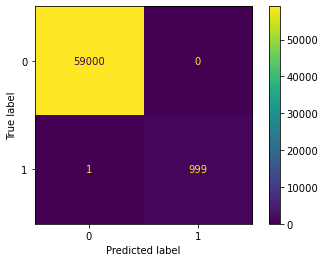

In [67]:
#confusion matrix Train
xgb_y_pre_train = xgb_m.predict(train_X)

print('The confusion matrix for training is \n',confusion_matrix(train_y, xgb_y_pre_train))
cm =confusion_matrix(train_y, xgb_y_pre_train)
d = ConfusionMatrixDisplay(confusion_matrix=cm)
d.plot()
plt.show()

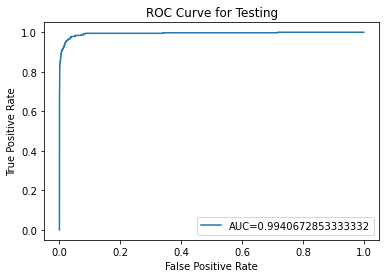

The AUC for test is 0.9940672853333332
The test error is  0.006000000000000005


In [94]:
#create ROC/AUC for testing

#finding the probability
y_pred_proba = xgb_m.predict_proba(test_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(test_y, y_pred_proba)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Testing')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()




#missclassification
score_test = accuracy_score(test_y,xgb_y_predict)
missclass_test = 1-score_test
print('The AUC for test is', auc)
print('The test error is ', missclass_test)

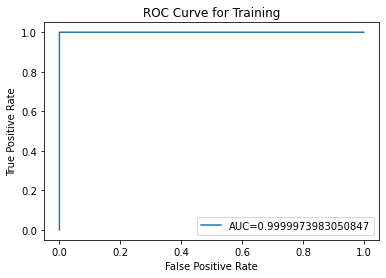

The AUC for training is 0.9999973983050847
The error for training is  1.666666666666483e-05


In [93]:
#create ROC/AUC for training

#finding the probability
y_pred_proba_t = xgb_m.predict_proba(train_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(train_y, y_pred_proba_t)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Training')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()


#missclassification for training

score_t = accuracy_score(train_y,xgb_y_pre_train)
missclass_train = 1-score_t
print('The AUC for training is', auc)
print('The error for training is ', missclass_train)


## The error of my training model is 1.666666666666483e-05 where as the error of my testing model is  0.006000000000000005. It is cleared that the training err is better than test error. The test error is worse because the dataset is imbalanced so 81 of the positive class(1) was missclassified out of 375 which is high proportion. 

### Resources:<br>
http://piti118.github.io/babar_python_tutorial/notebooks/03_Multivariate_Analysis.html

# F

Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance <br>
Train XGBosst with L1-penalized logistic regression at each node using the pre-processed data and repeat 1e. <br>
Do not forget that there is a right and a wrong way of cross validation here. Compare the uncompensated case with SMOTE case.


Note: <br>
SMOTE has to be performed inside CV. This is because we do not want data leakage when we perform CV. This is because smote should never be performed on the test set, and when we CV we dont want the fold that gets tested to have SMOTE instances, as they are based on the training sample, which could influence the accuracy/error. Hence, SMOTE is supposed to be done inside the CV. <br>
SMOTE has to be done within each CV fold so that we have a balanced fold every time. <br>
we want cross validation to be best estimate of unseen test-data. When we use SMOTE and for example balance the data to 50%,50% of both the classes and then do a stratified kfold, which will try to preserve this 50% split across all its train-test sets. Hence, in a way the test error which we get wouldnt reflect the actual test error since we are balancing our test set, which is wrong. Also, data would leak from training samples to test samples while cross validating.

<br>
I should use K-fold not SatrifiedKfold
StratifiedKFold just makes sure that each class has equal samples in all folds. The fold that's kept aside for validation in an iteration of CV would have already been treated with smote which is not correct. 


In [83]:
# Smote
sm = SMOTE(random_state=42)
X_train_re, y_train_re= sm.fit_resample(train_X, train_y)


In [84]:
for a in alphas_value:
    xgb_model = xgb.XGBClassifier(objective='reg:logistic', reg_alpha = a)
    score = cross_val_score(xgb_model, X_train_re, y_train_re, cv=KFold(5,shuffle=True),n_jobs=-1)
    print(a, '\t',1-max(score))

0.0001 	 0.0020338983050847137
0.001 	 0.0021610169491524944
0.01 	 0.0017796610169491522
0.1 	 0.001949152542372934
1 	 0.001949152542372934
10 	 0.002457627118644057


In [85]:
# fit model with best alpha 
model_xgb_ = xgb.XGBClassifier(objective='reg:logistic', reg_alpha = 0.001)
model_xgb_.fit(X_train_re, y_train_re)


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='reg:logistic',
              predictor='auto', random_state=0, reg_alpha=0.001, ...)

CM for test [[15584    41]
 [   68   307]]


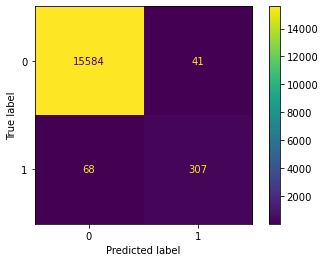

In [87]:
y_pred_test = model_xgb_.predict(test_X)

#confusion matrix test

print("CM for test", confusion_matrix(test_y, y_pred_test))
cm = confusion_matrix(test_y,y_pred_test)
dis = ConfusionMatrixDisplay(confusion_matrix=cm)
dis.plot()
plt.show()

CM for training [[59000     0]
 [    1 58999]]


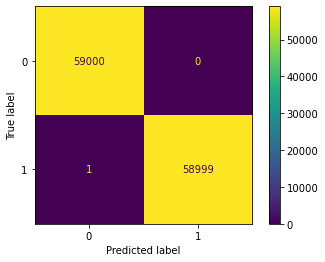

In [89]:
#confusion matrix train
predict_y_train = model_xgb_.predict(X_train_re)

print("CM for training", confusion_matrix(y_train_re, predict_y_train ))
cm = confusion_matrix(y_train_re,predict_y_train )
dis = ConfusionMatrixDisplay(confusion_matrix=cm)
dis.plot()
plt.show()


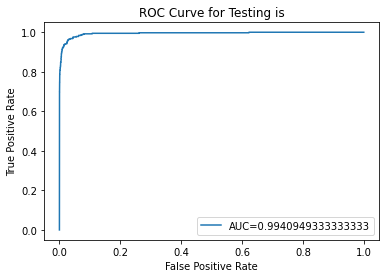

The AUC for test is 0.9940949333333333
The test error is  0.006812499999999999


In [91]:
#create ROC/AUC for testing 

#finding the probability
y_probability = model_xgb_.predict_proba(test_X)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(test_y, y_probability)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Testing is')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()



#missclassification
score_test = accuracy_score(test_y,y_pred_test)
missclass_test = 1-score_test
print('The AUC for test is', auc)
print('The test error is ', missclass_test)

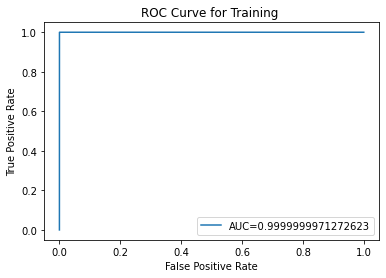

The AUC for training is 0.9999999971272623
The error for training is  8.47457627117798e-06


In [92]:
#create ROC/AUC for training 

#finding the probability
y_p_probability_t = model_xgb_.predict_proba(X_train_re)[:,1] 

#ROC
fpr, tpr, thresholds = metrics.roc_curve(y_train_re, y_p_probability_t)
#AUC
auc = metrics.auc(fpr,tpr)

plt.title('ROC Curve for Training ')
plt.plot(fpr, tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()

#missclassification for training

score_t = accuracy_score(y_train_re,predict_y_train)
missclass_train = 1-score_t
print('The AUC for training is', auc)
print('The error for training is ', missclass_train)

## After doing SOMTE, the test err 0.006812499999999999 is a bit higher than the test error before SOMTE 0.006000000000000005. The reason is that SOMTE adds some noise to increase the minority class. Another thing is that after doing SOMTE there is a better prediction for postive class (1) . The number of correct classified positive class is 307 and missclassified is 68. but without using SMOTE the correct classifid poitive class is 294 and missclassified is 81 which is worse compare to usining SMOTE. 

### Resources:

https://towardsdatascience.com/the-right-way-of-using-smote-with-cross-validation-92a8d09d00c7 <br>
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

#### ISLR 6.6.3
- a. steadily decrease. When we increased the value of s, the value we restricting the value of beta j decreased. As a result, the model would be closer to the train data and the train RSS would decrease.
- b. decrease initially, and then eventually start increasing in a U shape. As the value we restricting the value of beta j decreased, the model would be closer to the training data. As a result, the test RSS would follow the typical U shape which decrease at first and then increase.
- c. steadily increase. As we restricting the beta coefficient less and less, the model would become more flexible and the variance would increase.
- d. steadily decrease. As the variance of the model increased. Followed by the bias-variance trade off, the bias would decreased. 
- e. reamain constant. Due to it is irreducible, the irreducible error would not changed by the value of s; it is independant of our model.

#### ISLR 6.6.5

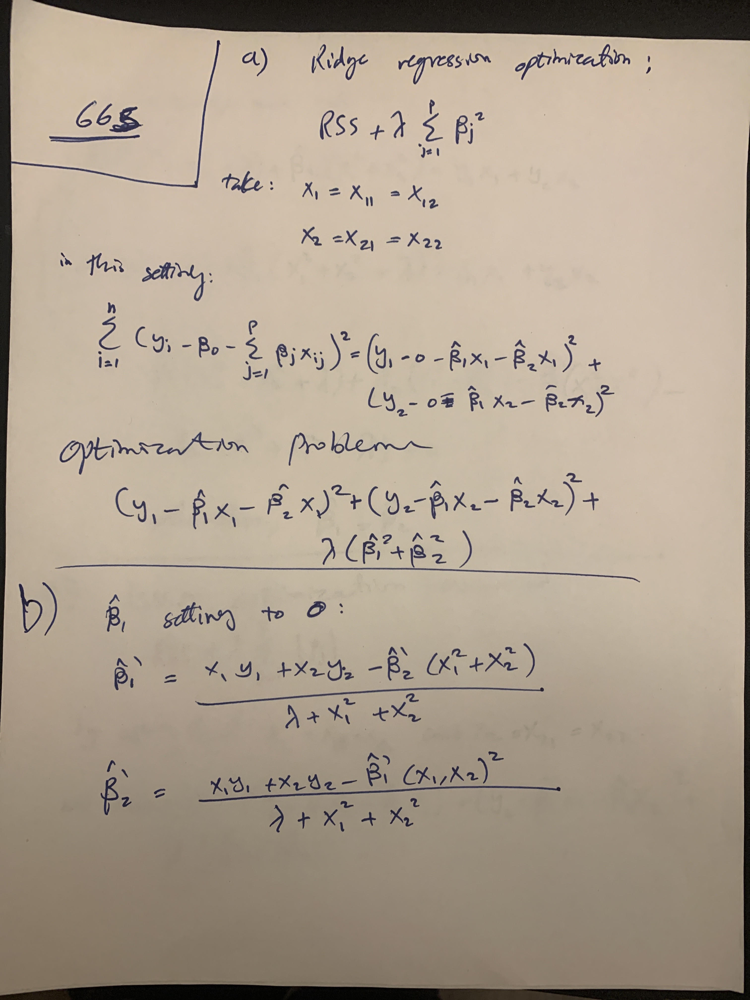

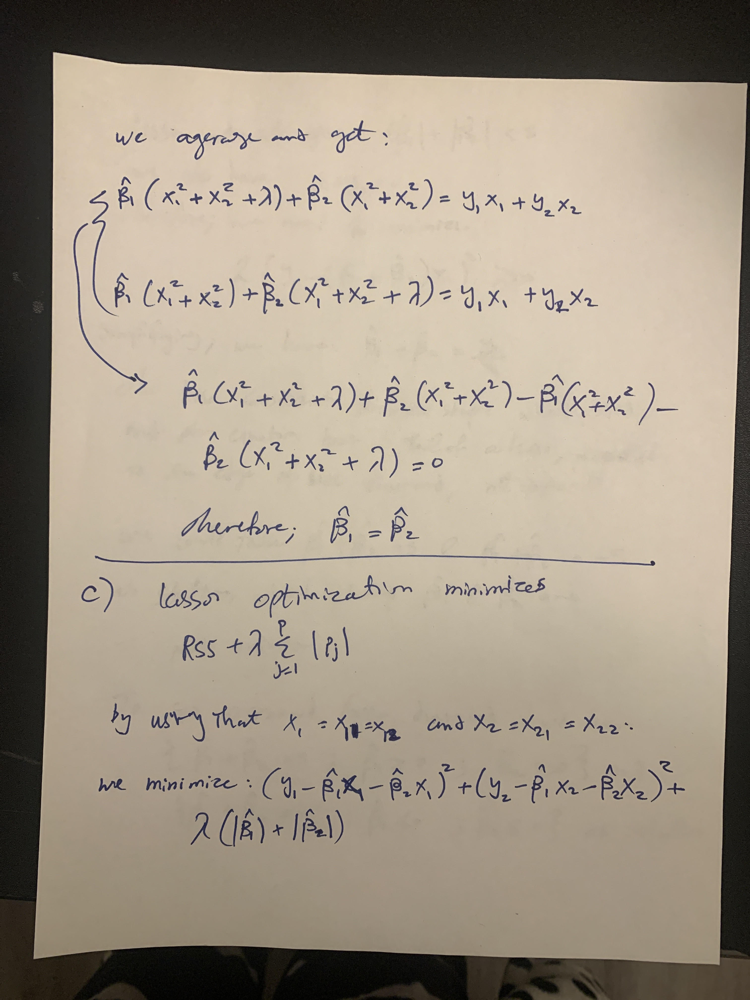

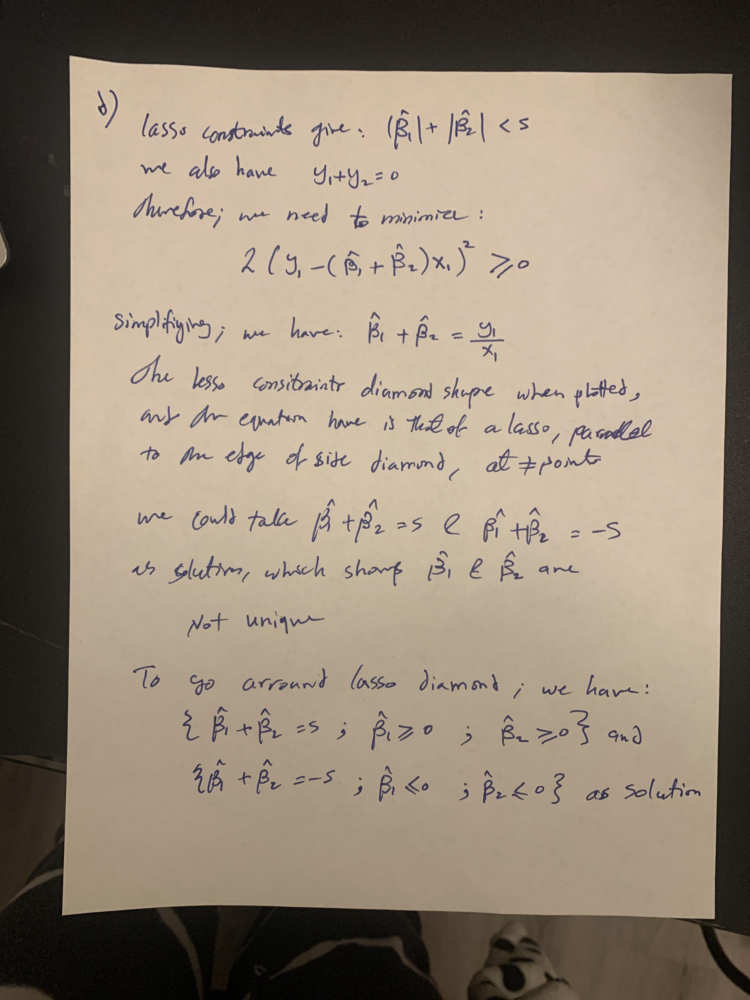

#### ISLR 8.4.5
Followd by the majority vote approach, we would classify the X to red. Because among the 10 predictions, 6 of them is greater than 0.5. However, if we used the average probability approach, we classify it as as green becasue the average of the prob is 0.45 which is smaller than 0.5. 

#### ISLR 9.7.3

# A

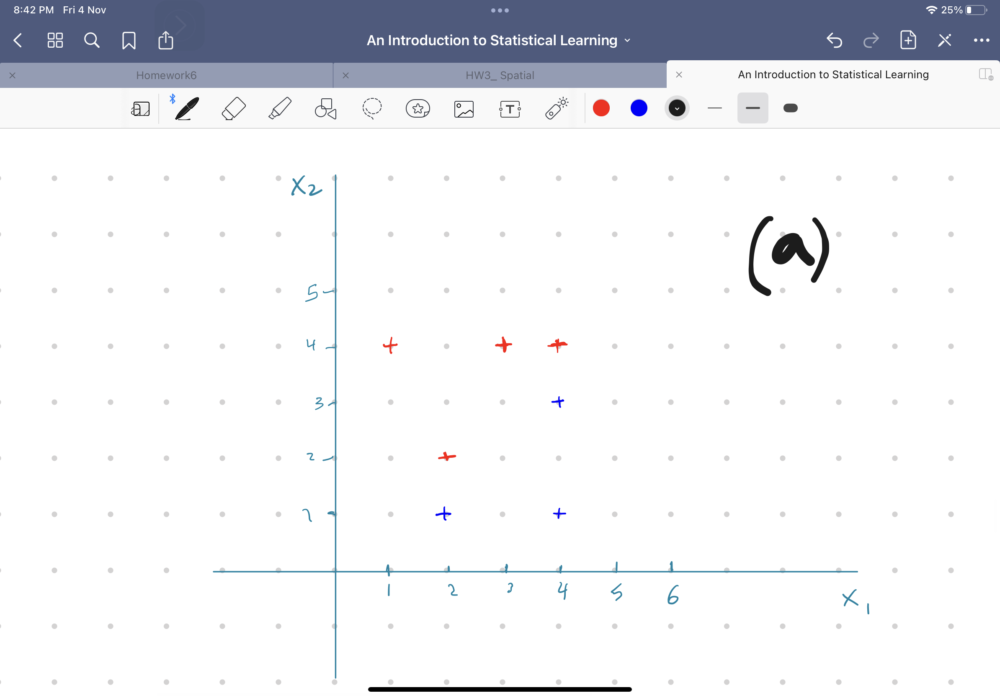

# B

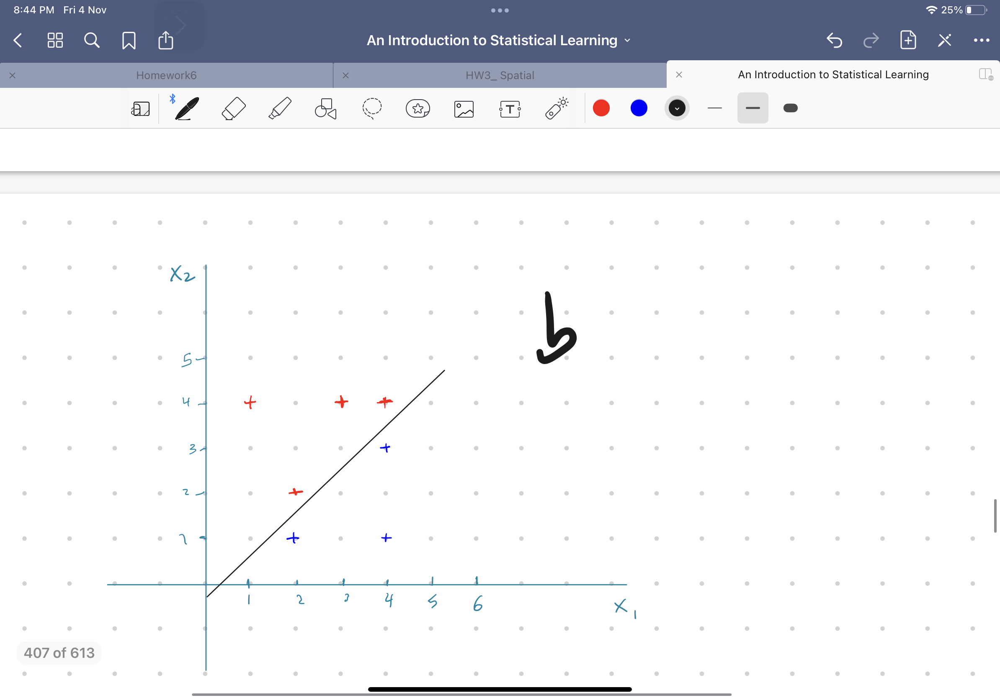

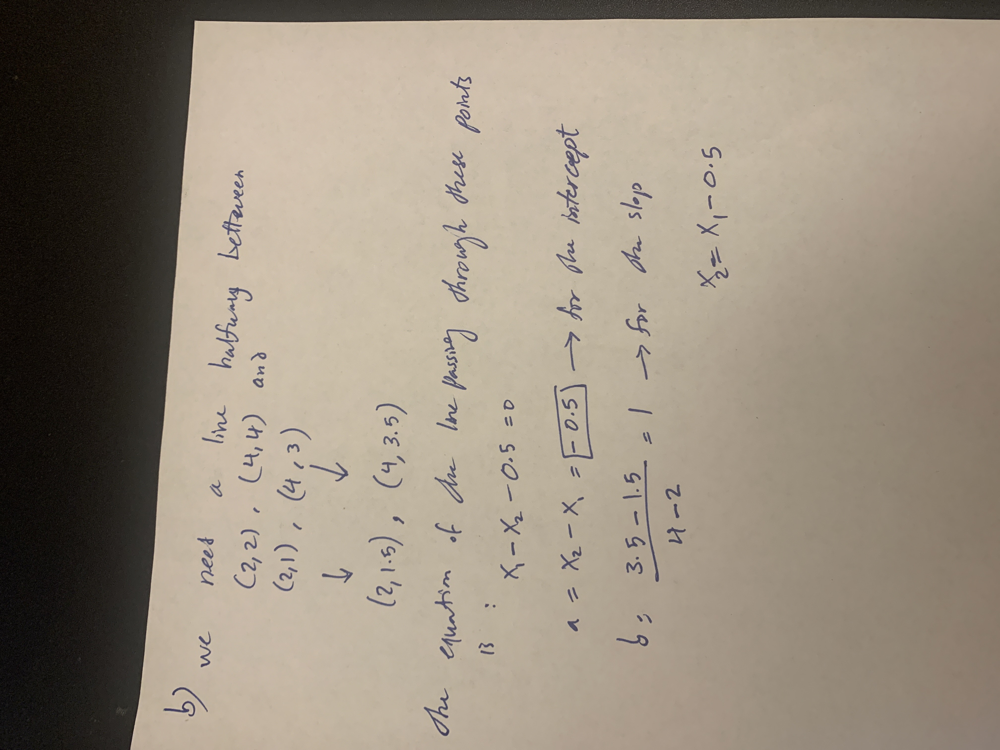

# C

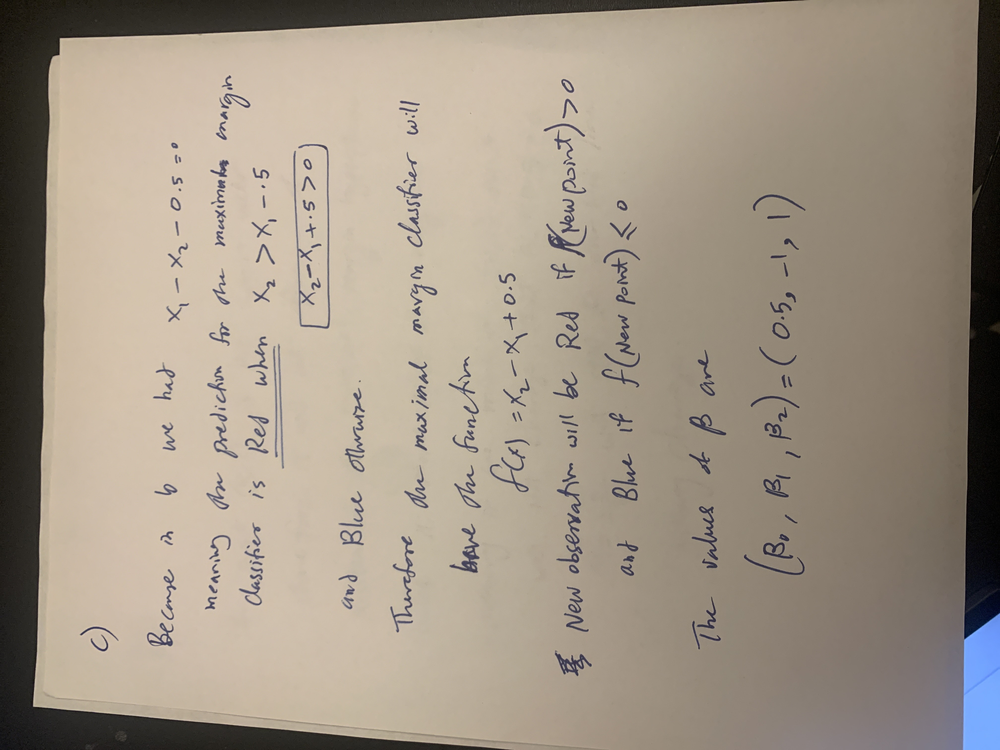

# D

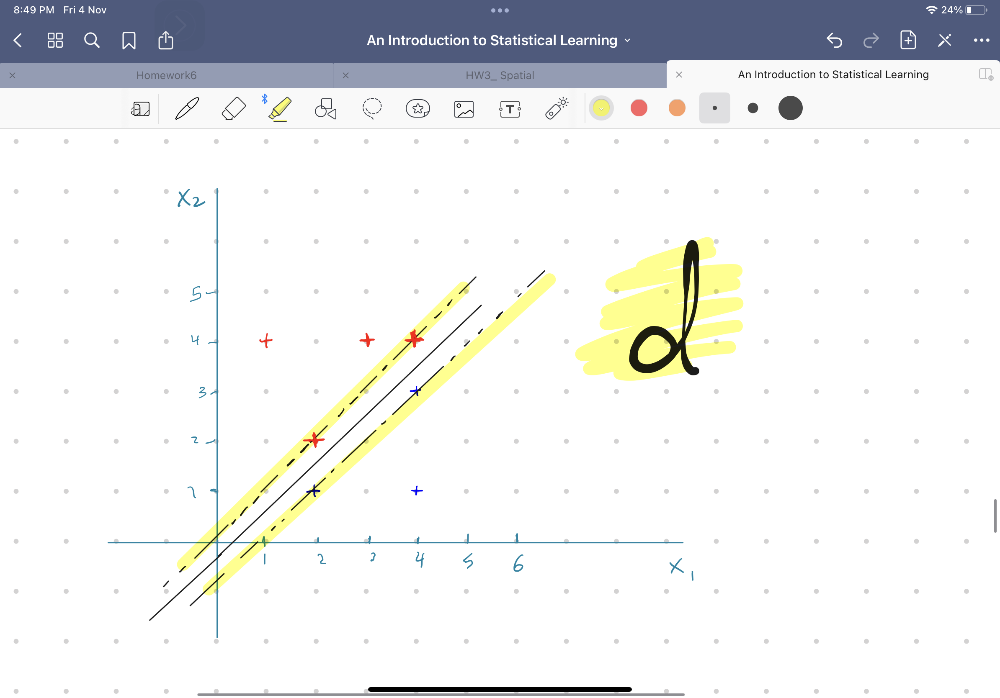

# E

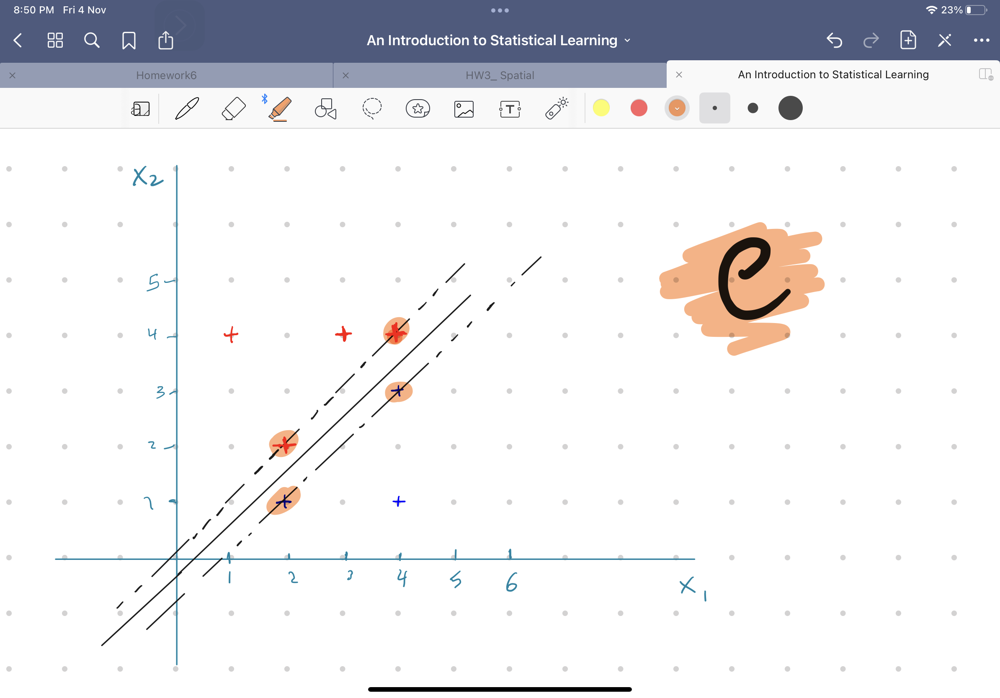

# F

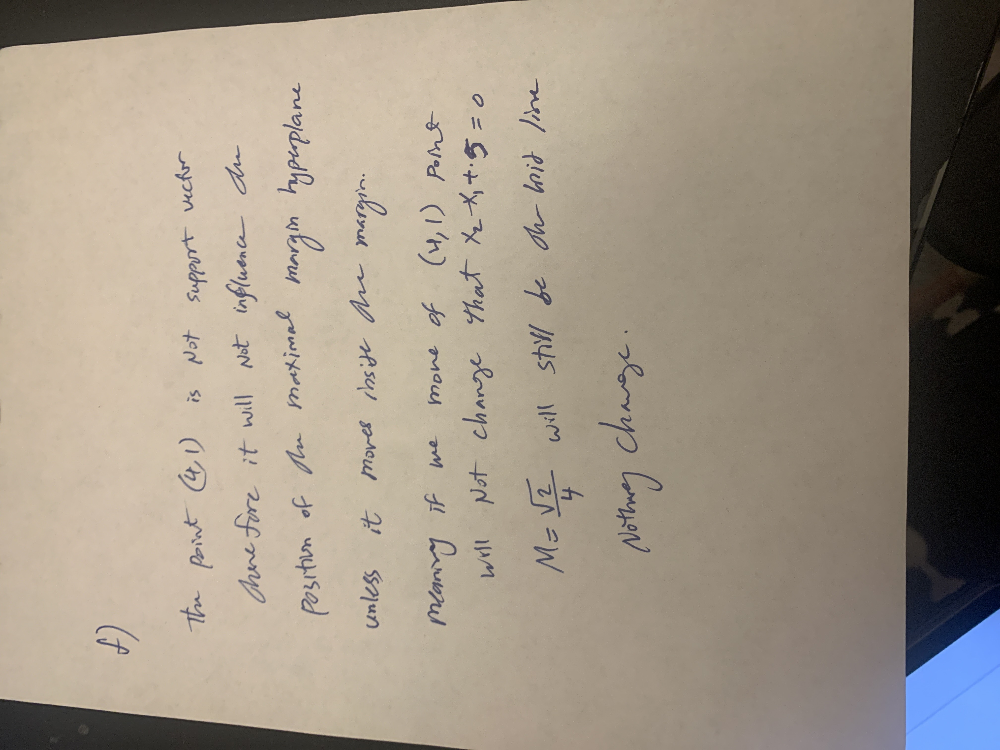

# G

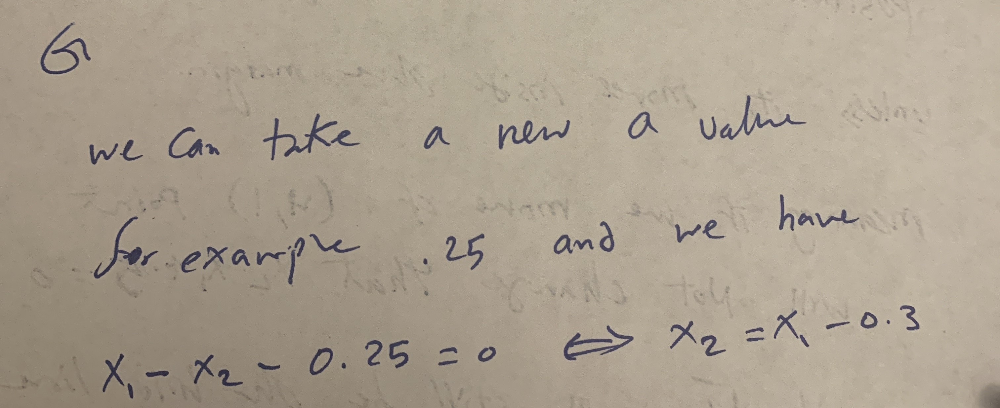

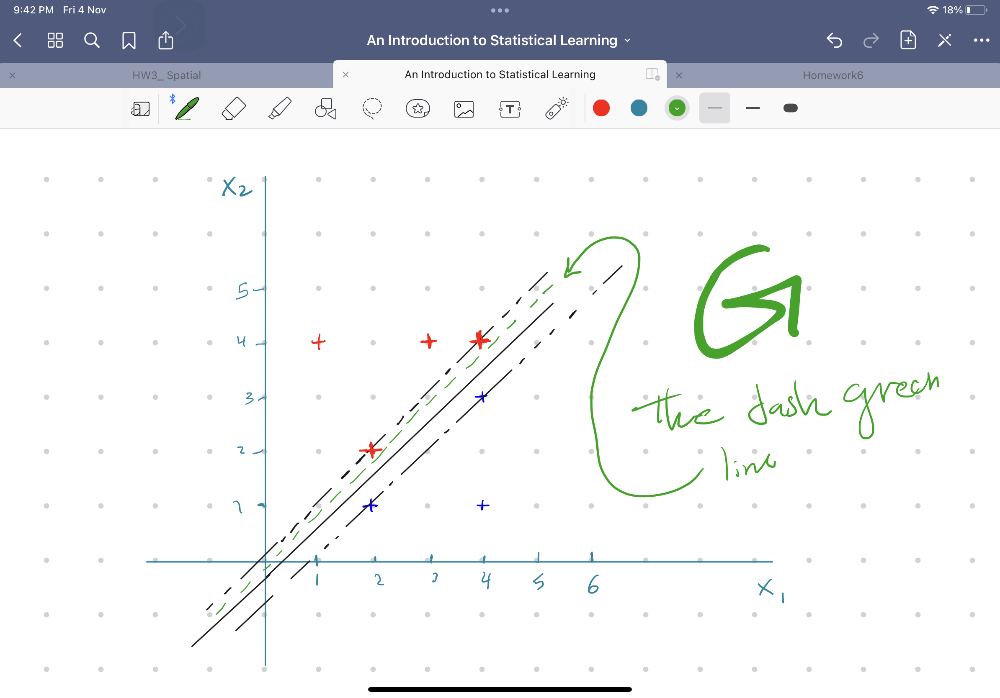

# H

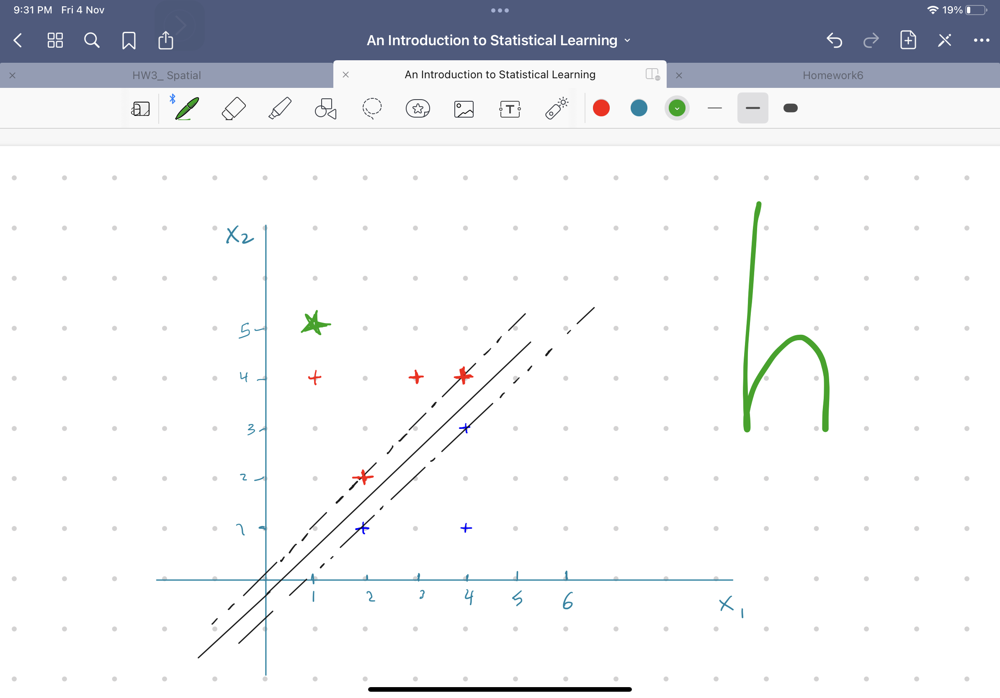

## The star in green color is a new observation. Placing Bluepoint in the Red classification section makes the two classes No longer linearly sepratable. 

In [120]:
# !pip freeze > requirements.txt